In [2]:
#Creating Low-resolution images [train]
%run create_lr_img.py --input_dir "C:/Users/User/Desktop/SRGAN/div2k_train_val/train/train_hr" --output_dir "C:/Users/User/Desktop/SRGAN/div2k_train_val/train/train_lr"


Processing 720 images from C:/Users/User/Desktop/SRGAN/div2k_train_val/train/train_hr...


100%|████████████████████████████████████████████████████████████████████████████████| 720/720 [01:54<00:00,  6.30it/s]

Done! LR images saved in C:/Users/User/Desktop/SRGAN/div2k_train_val/train/train_lr


In [1]:
#Creating Low-resolution images [validation]
%run create_lr_img.py --input_dir "C:/Users/User/Desktop/SRGAN/div2k_train_val/val/val_hr" --output_dir "C:/Users/User/Desktop/SRGAN/div2k_train_val/val/val_lr"


Processing 90 images from C:/Users/User/Desktop/SRGAN/div2k_train_val/val/val_hr...


100%|██████████████████████████████████████████████████████████████████████████████████| 90/90 [00:12<00:00,  6.95it/s]

Done! LR images saved in C:/Users/User/Desktop/SRGAN/div2k_train_val/val/val_lr


In [2]:
#--help
%run display_image.py --help
print("\n\n\n")
%run train.py --help

usage: display_image.py [-h] --original ORIGINAL --bicubic BICUBIC --srgan SRGAN [--patch_x PATCH_X]
                        [--patch_y PATCH_Y] [--patch_size PATCH_SIZE]

Display three images with extracted patches and compute PSNR and MSE.

optional arguments:
  -h, --help            show this help message and exit
  --original ORIGINAL   Path to the original image
  --bicubic BICUBIC     Path to the bicubic image
  --srgan SRGAN         Path to the SRGAN image
  --patch_x PATCH_X     X coordinate for patch (default: 50)
  --patch_y PATCH_Y     Y coordinate for patch (default: 50)
  --patch_size PATCH_SIZE
                        Patch size (default: 256x256)




usage: train.py [-h] [--train_hr_dir TRAIN_HR_DIR] [--train_lr_dir TRAIN_LR_DIR] [--valid_hr_dir VALID_HR_DIR]
                [--valid_lr_dir VALID_LR_DIR] [--upscale_factor {2,3,4,8}] [--epochs EPOCHS] [--resume RESUME]
                [--mode {adversarial,generator}] [--pretrain PRETRAIN] [--cuda] [--out_dir OUT_DIR]

opt

In [3]:
import torch

if torch.cuda.is_available():
    device = torch.device("cuda")
    print("CUDA Device Name:", torch.cuda.get_device_name(0))
else:
    device = torch.device("cpu")
    print("CUDA not available, using CPU.")


CUDA Device Name: NVIDIA GeForce GTX 1650


Total training patches: 189000


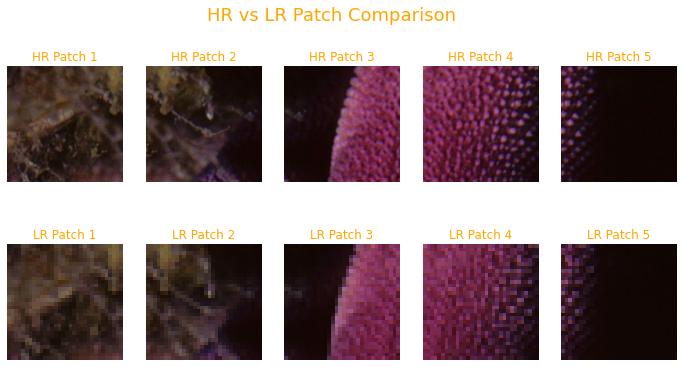

In [3]:
#To check if the number of patches and the output samples are aligned and correct [Train]
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
import torch
from utils import DIV2KTrainSet

# Initialize Training Dataset & DataLoader
train_set = DIV2KTrainSet(
    hr_dir="C:/Users/User/Desktop/SRGAN/div2k_train_val/train/train_hr/",
    lr_dir="C:/Users/User/Desktop/SRGAN/div2k_train_val/train/train_lr/",
    patch_size=128
)

trainloader = DataLoader(train_set, batch_size=1, shuffle=True)
print(f"Total training patches: {len(train_set)}")  # Display total patches

# Load a few samples
num_samples = 5
fig, axes = plt.subplots(2, num_samples, figsize=(12, 6))  # 2 rows (HR/LR), 5 columns

for i in range(num_samples):
    hr_patch, lr_patch = train_set[i+29] #adjust the value to the desired patches 

    hr_patch_np = hr_patch.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5  # De-normalize HR
    lr_patch_np = lr_patch.permute(1, 2, 0).cpu().numpy()  # LR (already normalized correctly)

    # HR Patch
    axes[0, i].imshow(hr_patch_np)
    axes[0, i].set_title(f"HR Patch {i+1}", fontsize=12, color='orange')
    axes[0, i].axis("off")

    # LR Patch
    axes[1, i].imshow(lr_patch_np)
    axes[1, i].set_title(f"LR Patch {i+1}", fontsize=12, color='orange')
    axes[1, i].axis("off")

plt.suptitle("HR vs LR Patch Comparison", fontsize=18, color='orange')
plt.show()

Total validation images: 90


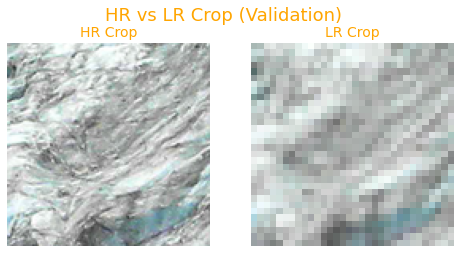

In [4]:
##To check if the number of patches and the output samples are aligned and correct [Validate]
from utils import DIV2KValidSet  # Ensure the dataset class is correctly imported

# Define validation directories
val_hr_dir = "C:/Users/User/Desktop/SRGAN/div2k_train_val/val/val_hr/"
val_lr_dir = "C:/Users/User/Desktop/SRGAN/div2k_train_val/val/val_lr/"

# Initialize Validation Dataset & DataLoader
valid_set = DIV2KValidSet(
    hr_dir=val_hr_dir,
    lr_dir=val_lr_dir,
    crop_size=128  # Center crop size
)

validloader = DataLoader(valid_set, batch_size=1, shuffle=False)
print(f"Total validation images: {len(valid_set)}")

# Fetch a validation sample
hr_crop, lr_crop = valid_set[11]  # Get first validation pair

# Convert HR & LR to NumPy for visualization
hr_crop_np = hr_crop.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5  # De-normalize HR
lr_crop_np = lr_crop.permute(1, 2, 0).cpu().numpy()  # LR (not normalized)

# Plot the HR and LR crops
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
fig.suptitle("HR vs LR Crop (Validation)", fontsize=18, color='orange')

# HR Image
axes[0].imshow(hr_crop_np)
axes[0].set_title("HR Crop", fontsize=14, color='orange')
axes[0].axis("off")

# LR Image
axes[1].imshow(lr_crop_np)
axes[1].set_title("LR Crop", fontsize=14, color='orange')
axes[1].axis("off")

plt.show()

In [1]:
#Adverserial training
#Resume Training the generator with maximum amount of patches for 150 images from pretrained weights

import time

def format_time(seconds):
    """Convert seconds into hours, minutes, and seconds."""
    hours = int(seconds // 3600)
    minutes = int((seconds % 3600) // 60)
    secs = seconds % 60
    return f"{hours}h {minutes}m {secs:.2f}s" if hours else (f"{minutes}m {secs:.2f}s" if minutes else f"{secs:.2f}s")

try:
    start_time = time.time()  # Start time
    print("Process started... Press CTRL+C to interrupt.")
    
    %run train.py --train_hr_dir "C:/Users/User/Desktop/SRGAN/div2k_train_val/train/train_hr/" \
                  --train_lr_dir "C:/Users/User/Desktop/SRGAN/div2k_train_val/train/train_lr/" \
                  --valid_hr_dir "C:/Users/User/Desktop/SRGAN/div2k_train_val/val/val_hr/" \
                  --valid_lr_dir "C:/Users/User/Desktop/SRGAN/div2k_train_val/val/val_lr/" --mode adversarial --cuda        
                  
except KeyboardInterrupt:
    print("\nProcess interrupted by user!")

finally:
    end_time = time.time()  # Capture end time
    elapsed_time = end_time - start_time  # Calculate elapsed time
    print(f"Process completed (or stopped) in {format_time(elapsed_time)}.")

Process started... Press CTRL+C to interrupt.


C:\Users\User\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch: 1/100


Img: 9   PSNR: 19.138948: 100%|████████████████████████████████████████████████████████| 10/10 [00:02<00:00,  3.68it/s]


epoch: 2/100


Img: 9   PSNR: 19.696550: 100%|████████████████████████████████████████████████████████| 10/10 [00:02<00:00,  4.23it/s]


epoch: 3/100


Img: 9   PSNR: 19.926527: 100%|████████████████████████████████████████████████████████| 10/10 [00:04<00:00,  2.25it/s]


epoch: 4/100


G: 0.019345    D: 0.235016:   0%|                                                     | 5/5295 [00:01<29:32,  2.98it/s]


KeyboardInterrupt: 

Process completed (or stopped) in 1h 10m 47.42s.


In [6]:
import torch
print(torch.cuda.is_available())  # Should return True
print(torch.cuda.device_count())  # Should return number of GPUs
print(torch.cuda.get_device_name(0))  # Get GPU name


True
1
NVIDIA GeForce GTX 1650


In [2]:
import time

def format_time(seconds):
    """Convert seconds into hours, minutes, and seconds."""
    hours = int(seconds // 3600)
    minutes = int((seconds % 3600) // 60)
    secs = seconds % 60
    return f"{hours}h {minutes}m {secs:.2f}s" if hours else (f"{minutes}m {secs:.2f}s" if minutes else f"{secs:.2f}s")

try:
    start_time = time.time()  # Start time
    print("Process started... Press CTRL+C to interrupt.")
    
    %run train.py --train_hr_dir "C:/Users/User/Desktop/SRGAN/div2k_train_val/train/train_hr/" \
                  --train_lr_dir "C:/Users/User/Desktop/SRGAN/div2k_train_val/train/train_lr/" \
                  --valid_hr_dir "C:/Users/User/Desktop/SRGAN/div2k_train_val/val/val_hr/" \
                  --valid_lr_dir "C:/Users/User/Desktop/SRGAN/div2k_train_val/val/val_lr/" --mode generator --cuda \
                  --resume "C:/Users/User/Desktop/SRGAN/div2k_train_val/outputs/train_with_pretrain_weight1/check_points/check_point_epoch_5.pth"               

except KeyboardInterrupt:
    print("\nProcess interrupted by user!")

finally:
    end_time = time.time()  # Capture end time
    elapsed_time = end_time - start_time  # Calculate elapsed time
    print(f"Process completed (or stopped) in {format_time(elapsed_time)}.")

Process started... Press CTRL+C to interrupt.


C:\Users\User\Desktop\SRGAN\srgan_model\train.py:142: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  check_point = torch.load(check_point_path)


epoch: 6/100


Img: 44   PSNR: 19.783190: 100%|███████████████████████████████████████████████████████| 45/45 [00:10<00:00,  4.21it/s]


epoch: 7/100


Img: 44   PSNR: 19.777084: 100%|███████████████████████████████████████████████████████| 45/45 [00:10<00:00,  4.30it/s]


epoch: 8/100


Running Loss: 0.010120:  23%|████████████▌                                          | 413/1800 [06:59<23:27,  1.01s/it]


KeyboardInterrupt: 

Process completed (or stopped) in 1h 7m 30.68s.


In [4]:
#continue training
#Adverserial training
#Resume Training the generator with maximum amount of patches for 150 images from pretrained weights

import time

def format_time(seconds):
    """Convert seconds into hours, minutes, and seconds."""
    hours = int(seconds // 3600)
    minutes = int((seconds % 3600) // 60)
    secs = seconds % 60
    return f"{hours}h {minutes}m {secs:.2f}s" if hours else (f"{minutes}m {secs:.2f}s" if minutes else f"{secs:.2f}s")

try:
    start_time = time.time()  # Start time
    print("Process started... Press CTRL+C to interrupt.")
    
    %run train.py \
        --train_hr_dir "C:/Users/User/Desktop/SRGAN/div2k_train_val/train/train_hr/" \
        --train_lr_dir "C:/Users/User/Desktop/SRGAN/div2k_train_val/train/train_lr/" \
        --valid_hr_dir "C:/Users/User/Desktop/SRGAN/div2k_train_val/val/val_hr/" \
        --valid_lr_dir "C:/Users/User/Desktop/SRGAN/div2k_train_val/val/val_lr/" \
        --resume "C:\Users\User\Desktop\SRGAN\div2k_train_val\outputs\check_points\check_point_epoch_6.pth" \
        --mode adversarial \
        --cuda
                  
except KeyboardInterrupt:
    print("\nProcess interrupted by user!")

finally:
    end_time = time.time()  # Capture end time
    elapsed_time = end_time - start_time  # Calculate elapsed time
    print(f"Process completed (or stopped) in {format_time(elapsed_time)}.")

Process started... Press CTRL+C to interrupt.


C:\Users\User\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\User\Desktop\SRGAN\srgan_model\train.py:142: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-model

epoch: 7/100


Img: 44   PSNR: 19.672897: 100%|███████████████████████████████████████████████████████| 45/45 [00:20<00:00,  2.18it/s]


epoch: 8/100


Img: 44   PSNR: 19.667139: 100%|███████████████████████████████████████████████████████| 45/45 [00:10<00:00,  4.10it/s]


epoch: 9/100


Img: 44   PSNR: 19.693958: 100%|███████████████████████████████████████████████████████| 45/45 [00:20<00:00,  2.19it/s]


epoch: 10/100


Img: 44   PSNR: 19.659626: 100%|███████████████████████████████████████████████████████| 45/45 [00:10<00:00,  4.11it/s]


epoch: 11/100


G: 0.014978    D: 0.334415:  13%|██████▋                                            | 357/2700 [06:43<44:09,  1.13s/it]


KeyboardInterrupt: 

Process completed (or stopped) in 4h 7m 7.16s.


In [1]:
#continue training
#Adverserial training
#Resume Training the generator with maximum amount of patches for 150 images from pretrained weights

import time

def format_time(seconds):
    """Convert seconds into hours, minutes, and seconds."""
    hours = int(seconds // 3600)
    minutes = int((seconds % 3600) // 60)
    secs = seconds % 60
    return f"{hours}h {minutes}m {secs:.2f}s" if hours else (f"{minutes}m {secs:.2f}s" if minutes else f"{secs:.2f}s")

try:
    start_time = time.time()  # Start time
    print("Process started... Press CTRL+C to interrupt.")
    
    %run train.py \
        --train_hr_dir "C:/Users/User/Desktop/SRGAN/div2k_train_val/train/train_hr/" \
        --train_lr_dir "C:/Users/User/Desktop/SRGAN/div2k_train_val/train/train_lr/" \
        --valid_hr_dir "C:/Users/User/Desktop/SRGAN/div2k_train_val/val/val_hr/" \
        --valid_lr_dir "C:/Users/User/Desktop/SRGAN/div2k_train_val/val/val_lr/" \
        --resume "C:\Users\User\Desktop\SRGAN\div2k_train_val\outputs\check_points\check_point_epoch_10.pth" \
        --mode adversarial \
        --cuda
                  
except KeyboardInterrupt:
    print("\nProcess interrupted by user!")

finally:
    end_time = time.time()  # Capture end time
    elapsed_time = end_time - start_time  # Calculate elapsed time
    print(f"Process completed (or stopped) in {format_time(elapsed_time)}.")

Process started... Press CTRL+C to interrupt.


C:\Users\User\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\User\Desktop\SRGAN\srgan_model\train.py:142: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-model

epoch: 11/100


Img: 44   PSNR: 19.632036: 100%|███████████████████████████████████████████████████████| 45/45 [00:12<00:00,  3.64it/s]


epoch: 12/100


Img: 44   PSNR: 19.652117: 100%|███████████████████████████████████████████████████████| 45/45 [00:11<00:00,  3.78it/s]


epoch: 13/100


Img: 44   PSNR: 19.637783: 100%|███████████████████████████████████████████████████████| 45/45 [00:10<00:00,  4.12it/s]


epoch: 14/100


Img: 44   PSNR: 19.654724: 100%|███████████████████████████████████████████████████████| 45/45 [00:11<00:00,  3.91it/s]


epoch: 15/100


G: 0.015006    D: 0.315144:   5%|██▎                                              | 128/2700 [03:12<1:04:18,  1.50s/it]


KeyboardInterrupt: 

Process completed (or stopped) in 4h 25m 27.40s.


In [9]:
#test for generator after adverserial training
%run test.py --image "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\0811.png" --upscale_factor 4 --weight "C:\Users\User\Desktop\SRGAN\div2k_train_val\outputs\weights\G_epoch_10.pth" --downsample bicubic --cuda   

C:\Users\User\Desktop\SRGAN\srgan_model\test.py:32: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  saved_G_weight = torch.load(weight)



DONE SAVING...


### Display full

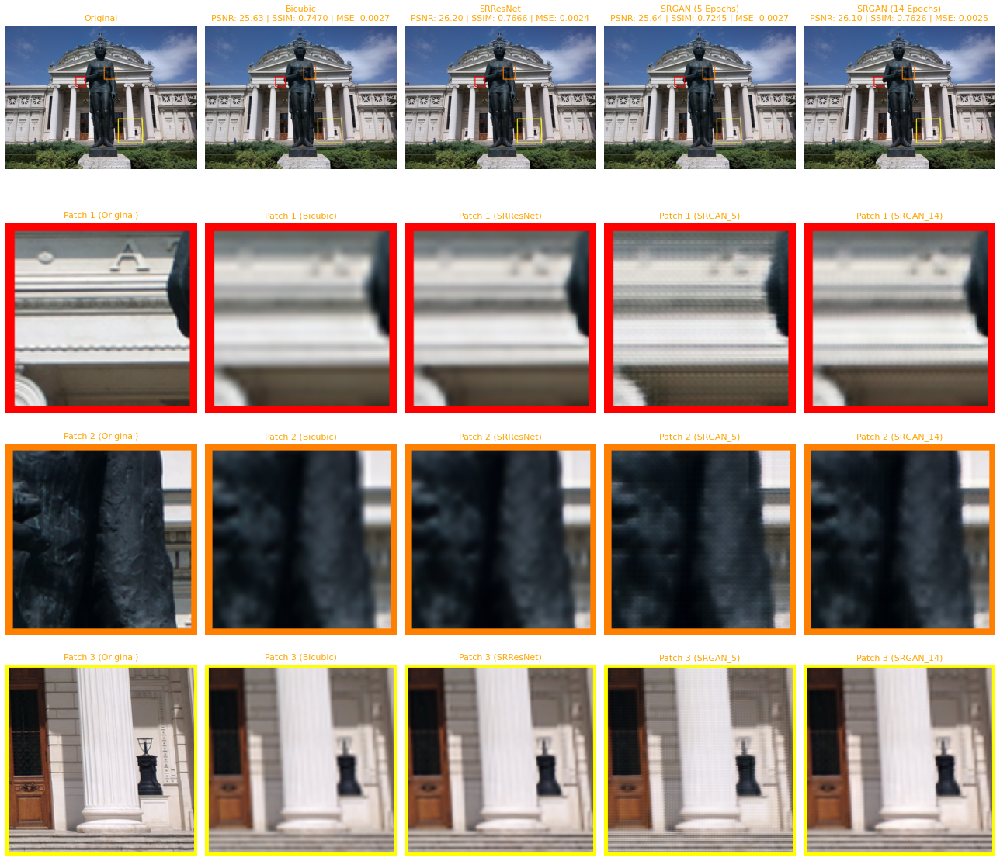

In [47]:
#Image 1
%run display_image_beta2.py \
--original "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRGAN_14\0812.png" \
--bicubic "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRGAN_14\0812_bicubic_x4.png" \
--srresnet "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRResNet_img\0812_srgan_x4.png"  \
--srgan5 "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRGAN_5\0812_srgan_x4.png"  \
--srgan14 "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRGAN_14\0812_srgan_x4.png" \
--patch_info 750 550 104 1050 450 128 1200 1000 256   


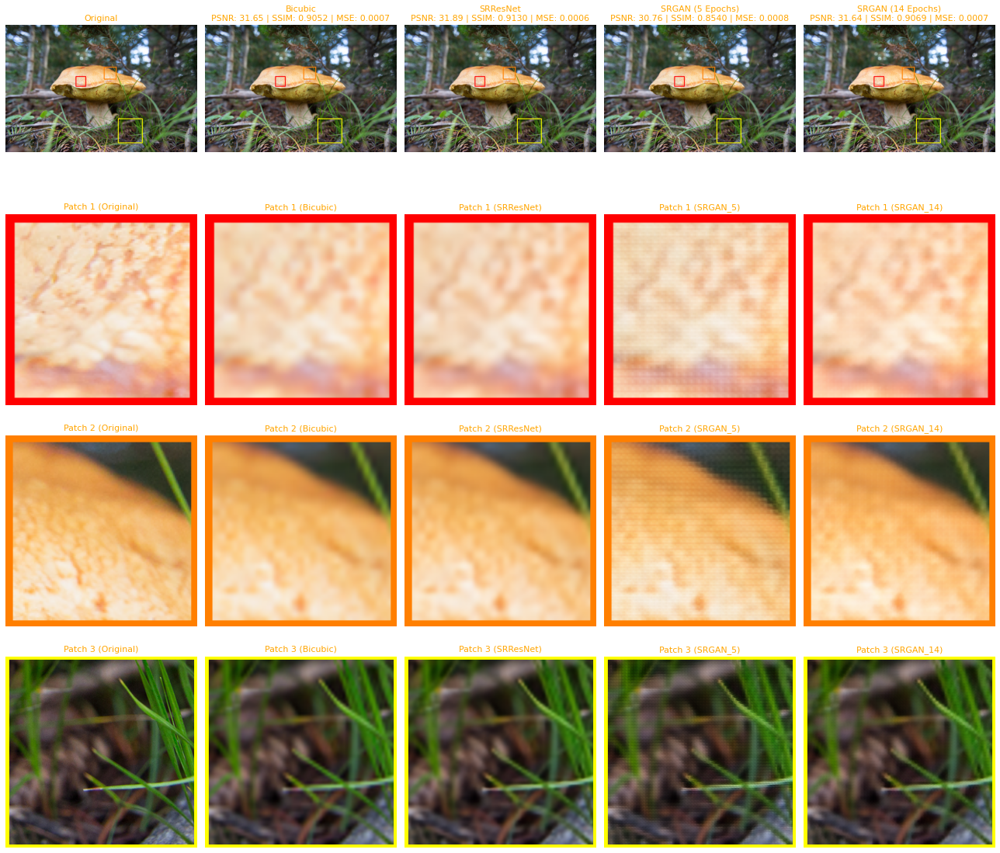

In [48]:
#Image 2
%run display_image_beta2.py \
--original "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRGAN_14\0815.png" \
--bicubic "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRGAN_14\0815_bicubic_x4.png" \
--srresnet "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRResNet_img\0815_srgan_x4.png"  \
--srgan5 "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRGAN_5\0815_srgan_x4.png"  \
--srgan14 "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRGAN_14\0815_srgan_x4.png" \
--patch_info 750 550 104 1050 450 128 1200 1000 256   


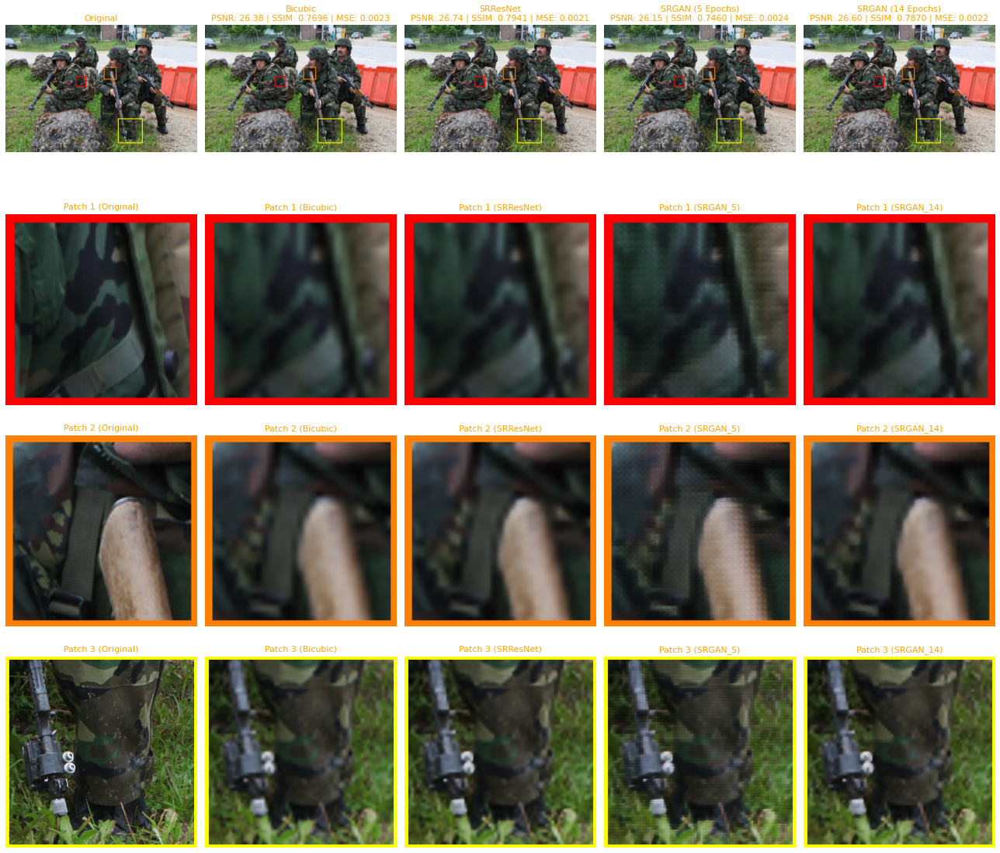

In [49]:
#Image 3
%run display_image_beta2.py \
--original "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRGAN_14\0819.png" \
--bicubic "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRGAN_14\0819_bicubic_x4.png" \
--srresnet "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRResNet_img\0819_srgan_x4.png"  \
--srgan5 "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRGAN_5\0819_srgan_x4.png"  \
--srgan14 "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRGAN_14\0819_srgan_x4.png" \
--patch_info 750 550 104 1050 450 128 1200 1000 256   


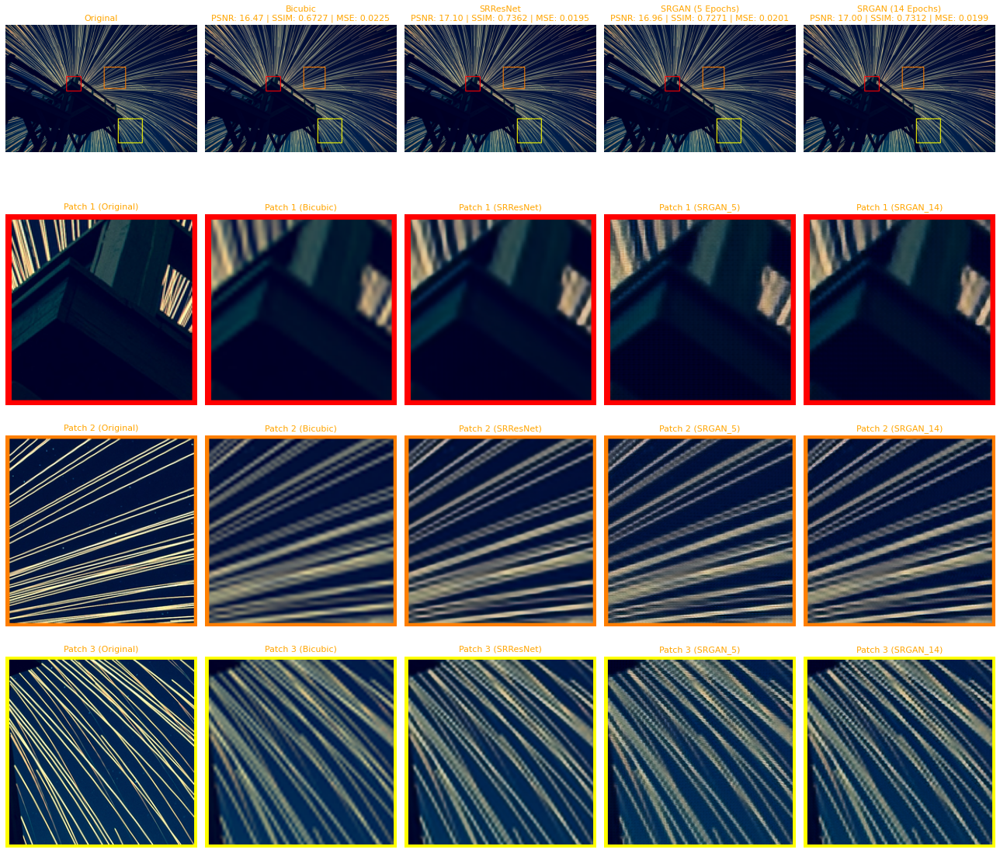

In [52]:
#Image 4
%run display_image_beta2.py \
--original "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRGAN_14\0828.png" \
--bicubic "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRGAN_14\0828_bicubic_x4.png" \
--srresnet "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRResNet_img\0828_srgan_x4.png"  \
--srgan5 "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRGAN_5\0828_srgan_x4.png"  \
--srgan14 "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRGAN_14\0828_srgan_x4.png" \
--patch_info 650 550 154 1050 450 228 1200 1000 256   


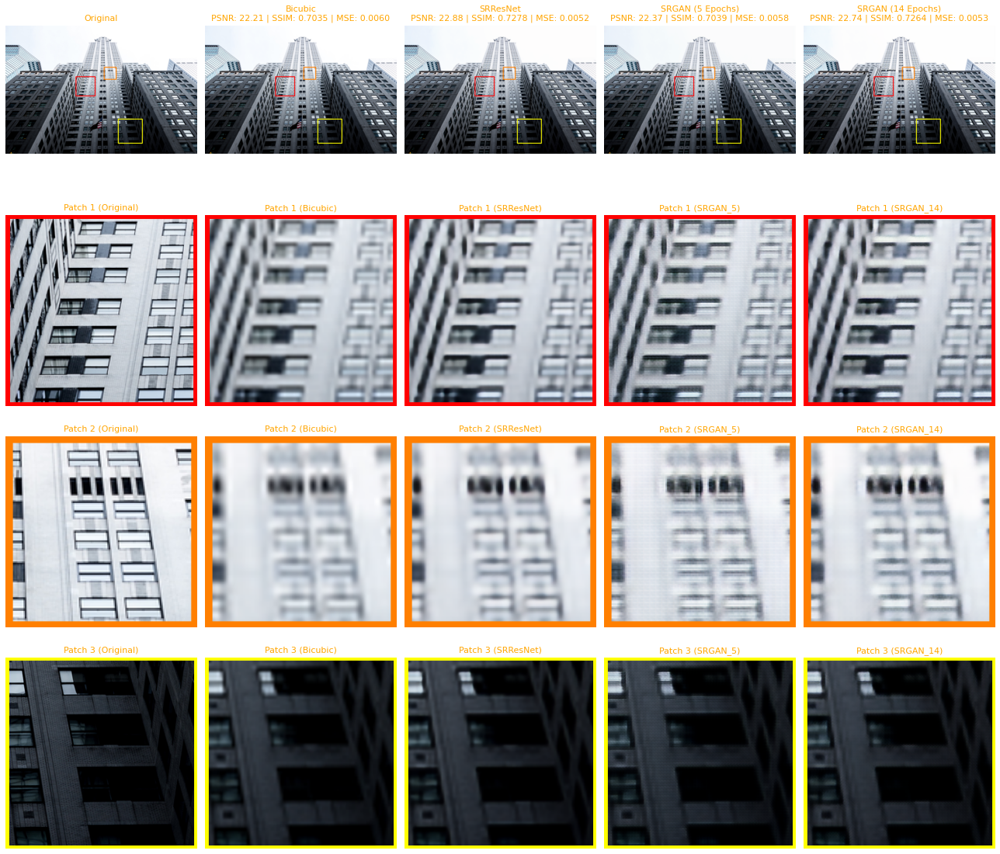

In [54]:
#Image 5
%run display_image_beta2.py \
--original "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRGAN_14\0846.png" \
--bicubic "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRGAN_14\0846_bicubic_x4.png" \
--srresnet "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRResNet_img\0846_srgan_x4.png"  \
--srgan5 "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRGAN_5\0846_srgan_x4.png"  \
--srgan14 "C:\Users\User\Desktop\SRGAN\div2k_train_val\test\test_img\SRGAN_14\0846_srgan_x4.png" \
--patch_info 750 550 204 1050 450 128 1200 1000 256   
